In [40]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge,Lasso,RidgeCV,LassoCV,ElasticNet,ElasticNetCV,LogisticRegression
from sklearn.model_selection import train_test_split
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import accuracy_score , confusion_matrix, roc_curve, roc_auc_score
import matplotlib.pyplot as plt
from pandas_profiling import ProfileReport
from ydata_profiling import ProfileReport
import seaborn as sns
import pickle

%matplotlib inline

In [18]:
df=pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/diabetes.csv')

In [19]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [20]:
df.shape

(768, 9)

In [21]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 9/9 [00:00<00:00, 2051.45it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [22]:
df.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

In [28]:
df[['Glucose','Outcome']].head()

,Glucose,Outcome
0,148,1
1,85,0
2,183,1
3,89,0
4,137,1


In [31]:
df['BMI']=df['BMI'].replace(0,df['BMI'].mean())

In [32]:
df['BloodPressure']=df['BloodPressure'].replace(0,df['BloodPressure'].mean())

In [33]:
df['Insulin']=df['Insulin'].replace(0,df['Insulin'].mean())

In [34]:
df['Glucose']=df['Glucose'].replace(0,df['Glucose'].mean())

In [36]:
df['SkinThickness']=df['SkinThickness'].replace(0,df['SkinThickness'].mean())

In [37]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|███████████████████████████████████████████████████████████████████████████████████| 9/9 [00:00<00:00, 468.32it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<Axes: >

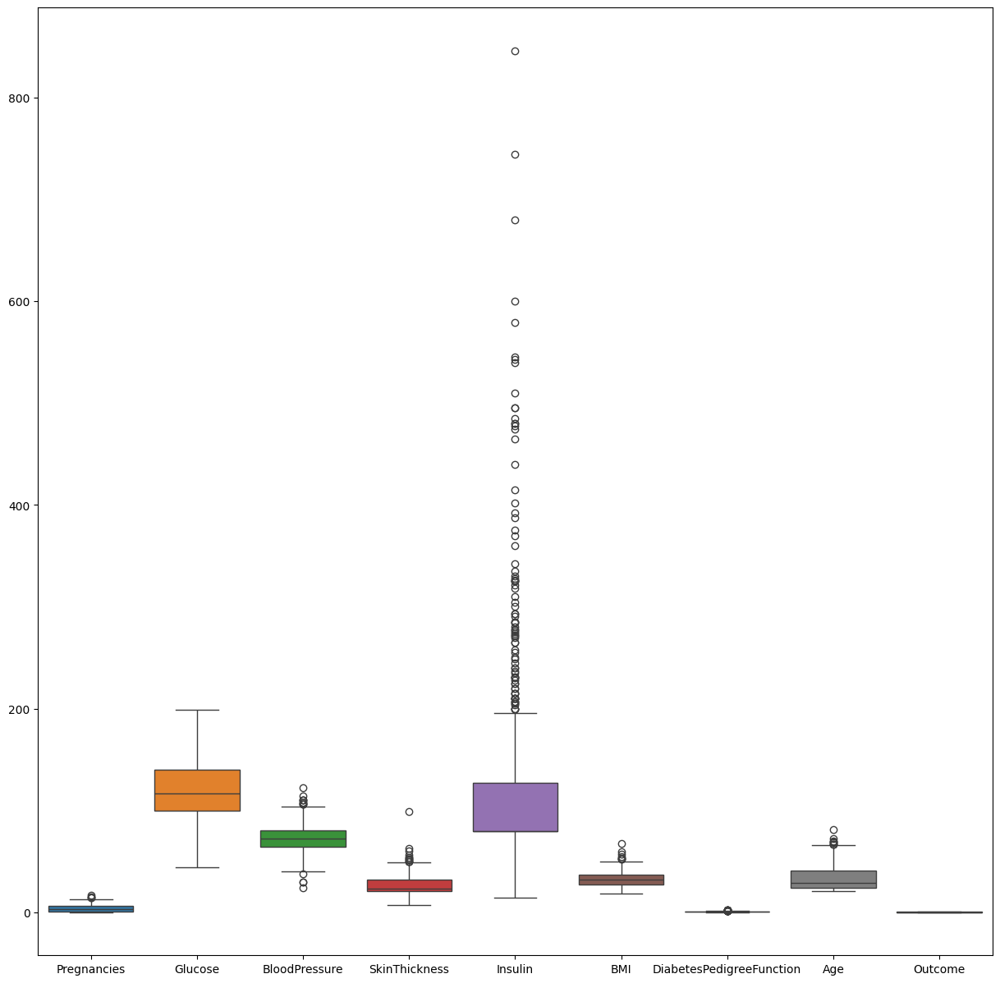

In [47]:
fig , ax =plt.subplots(figsize=(15,15))
sns.boxplot(data=df ,ax=ax)

In [48]:
q=df['Insulin'].quantile(0.90)
df_new=df[df['Insulin'] < q]

In [49]:
df_new

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
4,0,137.0,40.0,35.000000,168.000000,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63,0
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27,0
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30,0
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47,1


<Axes: >

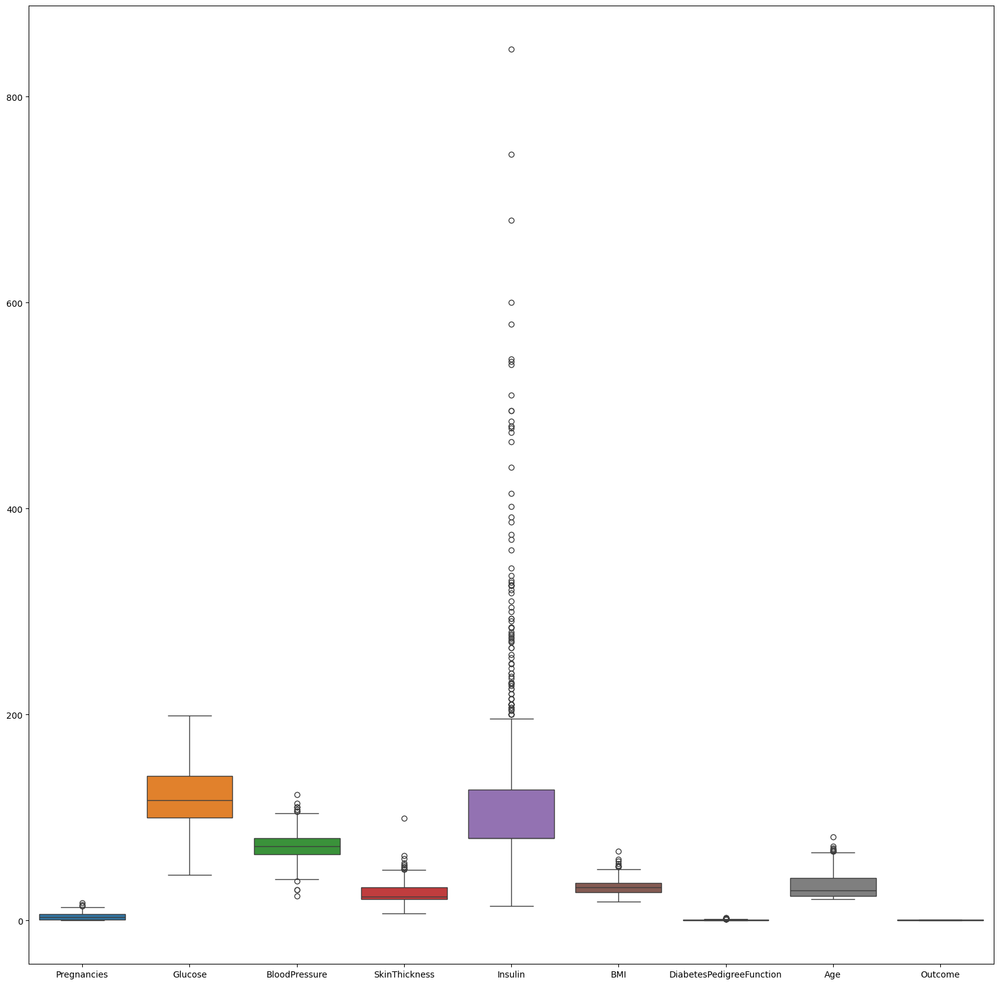

In [51]:
fig , ax =plt.subplots(figsize=(20,20))
sns.boxplot(data=df ,ax=ax)

In [68]:
df.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

In [78]:
q=df['Pregnancies'].quantile(0.98)
df_new=df[df['Pregnancies'] < q]

q=df_new['BMI'].quantile(0.99)
df_new = df_new[df_new['BMI'] < q]

q=df_new['SkinThickness'].quantile(0.99)
df_new = df_new[df_new['SkinThickness'] < q]

q=df_new['Insulin'].quantile(0.95)
df_new = df_new[df_new['Insulin'] < q]

q=df_new['DiabetesPedigreeFunction'].quantile(0.99)
df_new = df_new[df_new['DiabetesPedigreeFunction'] < q]



In [79]:
df_new.shape

(683, 9)

<Axes: >

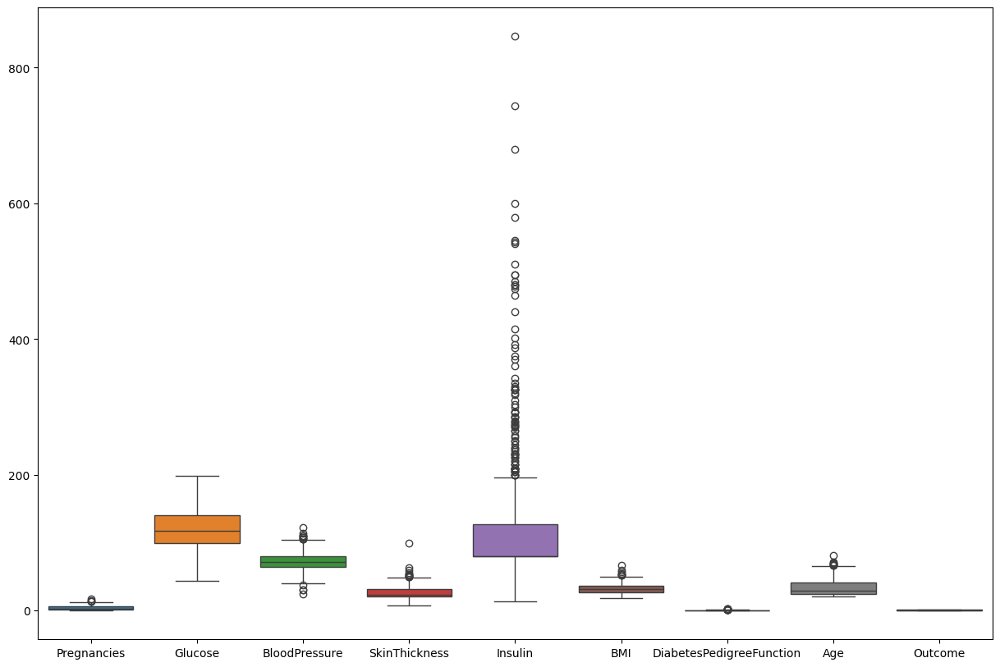

In [80]:
fig , ax =plt.subplots(figsize=(15,10))
sns.boxplot(data=df ,ax=ax)

In [81]:
## removing outlier function 

def outlier_removal(self,data):
    def outlier_limits(col):
        Q3,Q1 = np.nanpercentile(col , [75,25])
        IQR= Q3 - Q1
        UL=Q3 + 1.5 * IQR
        LL= Q1 - 1.5 * IQR

        return UL,LL
    for column in data.columns:
        if data[column].dtype != 'int64':
            UL,LL = outlier_limits(data[column])
            data[column]=np.where((data[column] > UL ) | (data[column] < LL) , np.nan , data[column])
    return data

In [83]:
y=df_new['Outcome']
y

0      1
1      0
2      1
3      0
5      0
      ..
763    0
764    0
765    0
766    1
767    0
Name: Outcome, Length: 683, dtype: int64

In [84]:
x=df_new.drop(columns=['Outcome'])

In [85]:
x

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21
5,5,116.0,74.0,20.536458,79.799479,25.6,0.201,30
...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47


In [86]:
scalar=StandardScaler()


In [90]:
ProfileReport(pd.DataFrame(scalar.fit_transform(df_new)))

x_scaled=scalar.fit_transform(df_new)


<Axes: >

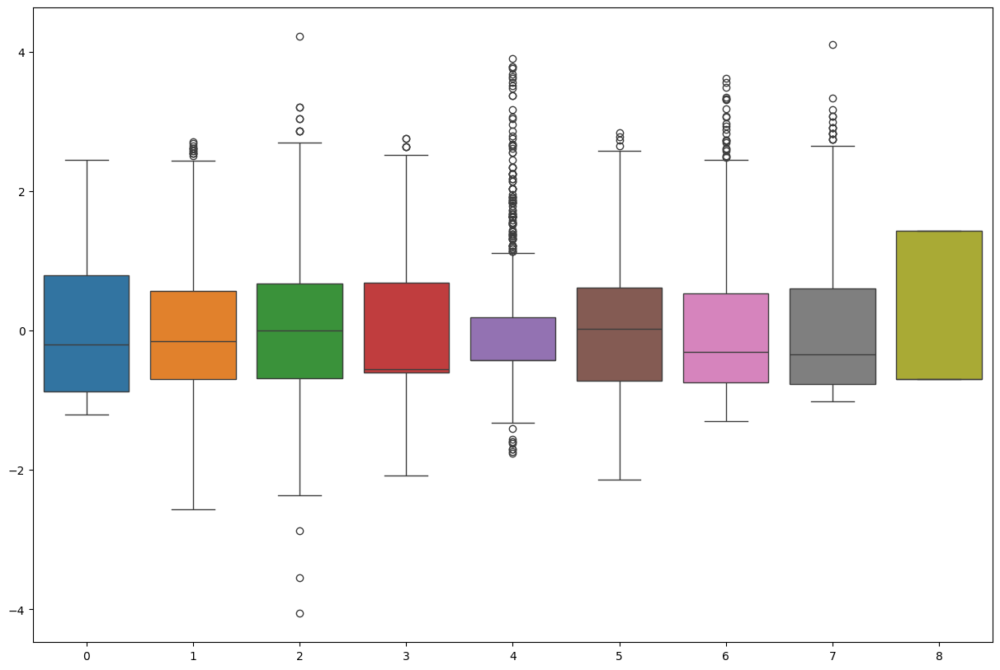

In [89]:
df_new_scalar=pd.DataFrame(scalar.fit_transform(df_new))
fig , ax =plt.subplots(figsize=(15,10))
sns.boxplot(data=df_new_scalar ,ax=ax)

In [91]:
x_scaled

array([[ 0.79026029,  0.97609753, -0.00438652, ...,  0.62857104,
         1.45664443,  1.43623824],
       [-0.87050211, -1.16924493, -0.51102985, ..., -0.34275154,
        -0.16647722, -0.69626332],
       [ 1.45456525,  2.16795445, -0.67991096, ...,  0.78693886,
        -0.08104977,  1.43623824],
       ...,
       [ 0.45810781,  0.05666505, -0.00438652, ..., -0.71579572,
        -0.25190468, -0.69626332],
       [-0.87050211,  0.22693032, -1.01767318, ..., -0.34979011,
         1.20036206,  1.43623824],
       [-0.87050211, -0.89682049, -0.17326763, ..., -0.46944579,
        -0.84989686, -0.69626332]])

In [96]:
def vif_score(x):
    scaler=StandardScaler()
    arr=scaler.fit_transform(x)
    return pd.DataFrame([[x.columns[i] , variance_inflation_factor(arr,i)] for i in range(arr.shape[1])],columns=['FEATURE','VIF_SCORE'])

In [98]:
vif_score(x)

,FEATURE,VIF_SCORE
0,Pregnancies,1.403837
1,Glucose,1.299819
2,BloodPressure,1.261605
3,SkinThickness,1.463149
4,Insulin,1.268354
5,BMI,1.507826
6,DiabetesPedigreeFunction,1.042604
7,Age,1.589891


In [100]:
x_train,x_test,y_train,y_test=train_test_split(x_scaled,y,test_size=20,random_state=144)

In [101]:
x_train

array([[-1.20265459, -0.62439605, -0.84879207, ..., -0.39554081,
        -0.67904195, -0.69626332],
       [ 0.45810781, -0.52223688,  0.16449459, ..., -1.03956991,
         1.28578952, -0.69626332],
       [ 1.12241277, -0.35197161,  0.67113792, ...,  2.3882134 ,
         0.85865224,  1.43623824],
       ...,
       [ 2.11887021,  0.0907181 , -0.34214874, ..., -0.67004502,
         0.68779733, -0.69626332],
       [-0.20619715, -0.79466132,  0.50225681, ..., -0.74043071,
         0.60236987, -0.69626332],
       [-0.87050211,  0.80583226,  0.16449459, ..., -0.67708359,
        -1.02075177, -0.69626332]])

In [102]:
y_train

407    0
636    0
314    1
166    0
252    0
      ..
725    0
481    0
246    0
504    0
413    0
Name: Outcome, Length: 663, dtype: int64

In [103]:
x_test

array([[-1.20265459,  0.15882421, -0.17326763, -0.66908742, -0.43002972,
        -0.69899505, -0.68412215,  0.26066005,  1.43623824],
       [-0.53834963, -1.6459877 , -0.17326763,  0.15730111, -0.43002972,
        -0.6050137 ,  0.48428037, -0.93532432, -0.69626332],
       [-0.20619715, -1.54382853, -0.34214874,  0.27535661, -1.14424458,
        -0.33873322, -0.54687005, -0.84989686, -0.69626332],
       [ 1.45456525,  0.80583226, -0.51102985, -0.60575556, -0.43002972,
         0.47577179, -1.12403274,  0.68779733,  1.43623824],
       [-1.20265459,  2.03174223, -1.86207872,  1.21980065,  1.19545983,
         0.93001497,  0.02325407, -0.93532432,  1.43623824],
       [-0.87050211, -0.01144106, -1.5243165 , -1.49547596, -1.04162597,
        -1.4978365 , -0.85656711, -0.76446941, -0.69626332],
       [ 2.45102269,  0.80583226,  1.85330569,  0.86563414,  0.92865143,
         0.74205227, -0.68412215,  1.54207188,  1.43623824],
       [ 0.45810781,  0.0907181 ,  1.17778125, -0.60575556, -0

In [112]:
logr=LogisticRegression(verbose=1)

In [113]:
logr.fit(x_train,y_train)

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


,penalty,'l2'
,dual,False
,tol,0.0001
,C,1.0
,fit_intercept,True
,intercept_scaling,1
,class_weight,None
,random_state,None
,solver,'lbfgs'
,max_iter,100
,multi_class,'deprecated'


In [114]:
logr.predict([x_test[0]])

array([1])

In [115]:
 logr.predict_proba([x_test[0]])

array([[0.02191319, 0.97808681]])

In [116]:
logr.predict_log_proba([x_test[0]])

array([[-3.82066647, -0.02215685]])

In [117]:
y_test.iloc[0]

np.int64(1)